<a href="https://colab.research.google.com/github/7amokarim/breast-cancer-detection-system/blob/main/yolo2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
Dfrom google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

DATASET_PATH = "/content/drive/MyDrive/breast ultrasound images dataset/Dataset_BUSI_with_GT"
OUTPUT_PATH = "/content/dataset_yolo"

In [ ]:
import shutil

normal_path = os.path.join(DATASET_PATH, "normal")

if os.path.exists(normal_path):
    shutil.rmtree(normal_path)
    print("✅ normal deleted")

In [ ]:
for split in ["train", "val"]:
    for folder in ["images", "labels"]:
        os.makedirs(f"{OUTPUT_PATH}/{folder}/{split}", exist_ok=True)

print("✅ folders created")

✅ folders created


In [ ]:
import cv2
import numpy as np
import random

CLASSES = {"benign": 0, "malignant": 1}
split_ratio = 0.8  # 80% train / 20% val

for cls_name in CLASSES.keys():
    folder_path = os.path.join(DATASET_PATH, cls_name)
    files = [f for f in os.listdir(folder_path) if "_mask" not in f]

    random.shuffle(files)
    split_index = int(len(files) * split_ratio)

    train_files = files[:split_index]
    val_files = files[split_index:]

    for split, file_list in zip(["train", "val"], [train_files, val_files]):

        for file in file_list:
            img_path = os.path.join(folder_path, file)
            mask_path = img_path.replace(".png", "_mask.png")

            if not os.path.exists(mask_path):
                continue

            img = cv2.imread(img_path)
            mask = cv2.imread(mask_path, 0)

            h, w = img.shape[:2]

            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

            label_lines = []

            for cnt in contours:
                x, y, bw, bh = cv2.boundingRect(cnt)

                xc = (x + bw / 2) / w
                yc = (y + bh / 2) / h
                bw /= w
                bh /= h

                label_lines.append(f"{CLASSES[cls_name]} {xc} {yc} {bw} {bh}")

            # save image
            cv2.imwrite(f"{OUTPUT_PATH}/images/{split}/{file}", img)

            # save label
            with open(f"{OUTPUT_PATH}/labels/{split}/{file.replace('.png','.txt')}", "w") as f:
                f.write("\n".join(label_lines))

print("✅ dataset converted + split done")

✅ dataset converted + split done


In [ ]:
data_yaml = f"""
path: {OUTPUT_PATH}

train: images/train
val: images/val

nc: 2
names: ['benign', 'malignant']
"""

with open("data.yaml", "w") as f:
    f.write(data_yaml)

print("✅ data.yaml ready")

✅ data.yaml ready


In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 29.0 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")

model.train(
    data="data.yaml",
    epochs=50,
    imgsz=640,
    batch=16,
    patience=10,


    hsv_h=0.015,
    hsv_s=0.7,
    hsv_v=0.4,

    flipud=0.5,
    fliplr=0.5,

    mosaic=1.0,
    mixup=0.2,

    degrees=10,
    scale=0.5,
    translate=0.1,

    verbose=True
)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.37 🚀 Python-3.12.13 torch-2.10.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=data.yaml, degrees=10, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.5, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False,

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d2e7597cb90>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [ ]:
results = model.predict(
    source="/content/dataset_yolo/images/train",
    save=True,
    conf=0.25
)


image 1/517 /content/dataset_yolo/images/train/benign (1).png: 544x640 1 benign, 167.6ms
image 2/517 /content/dataset_yolo/images/train/benign (100).png: 640x448 2 benigns, 148.1ms
image 3/517 /content/dataset_yolo/images/train/benign (101).png: 544x640 1 benign, 158.4ms
image 4/517 /content/dataset_yolo/images/train/benign (104).png: 480x640 2 benigns, 150.8ms
image 5/517 /content/dataset_yolo/images/train/benign (105).png: 448x640 1 benign, 136.9ms
image 6/517 /content/dataset_yolo/images/train/benign (106).png: 576x640 1 benign, 172.3ms
image 7/517 /content/dataset_yolo/images/train/benign (107).png: 544x640 2 benigns, 152.0ms
image 8/517 /content/dataset_yolo/images/train/benign (108).png: 512x640 1 malignant, 152.5ms
image 9/517 /content/dataset_yolo/images/train/benign (11).png: 576x640 1 benign, 177.9ms
image 10/517 /content/dataset_yolo/images/train/benign (110).png: 544x640 2 benigns, 160.3ms
image 11/517 /content/dataset_yolo/images/train/benign (111).png: 640x448 1 benign, 

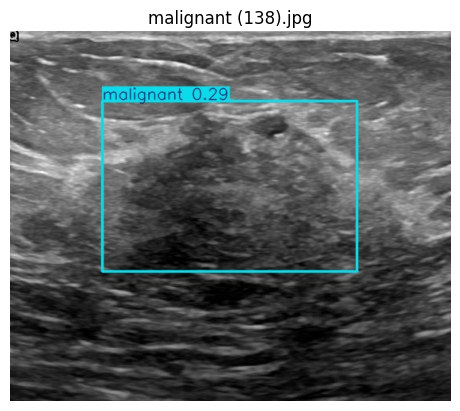

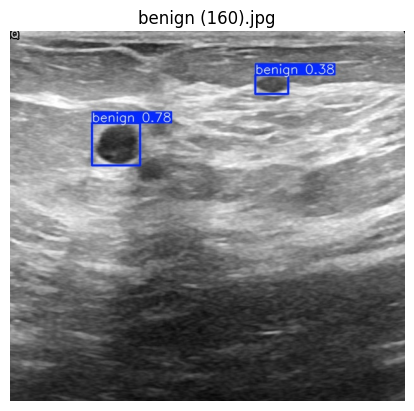

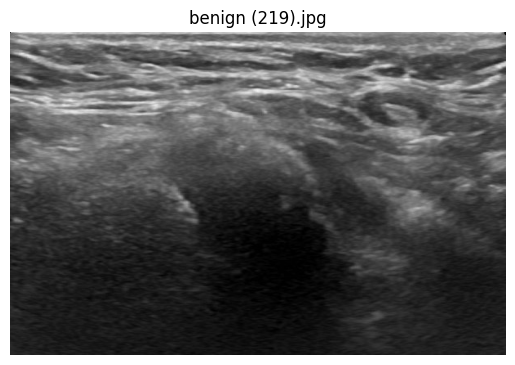

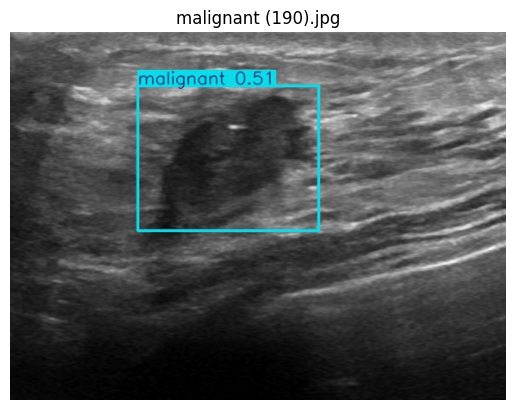

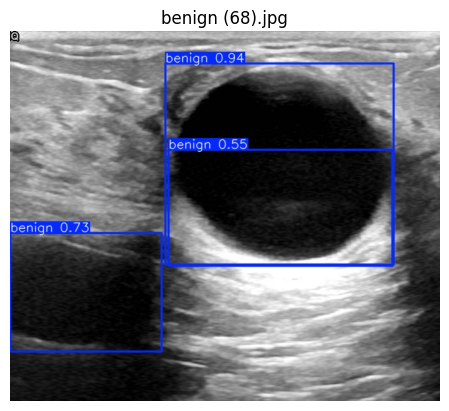

...

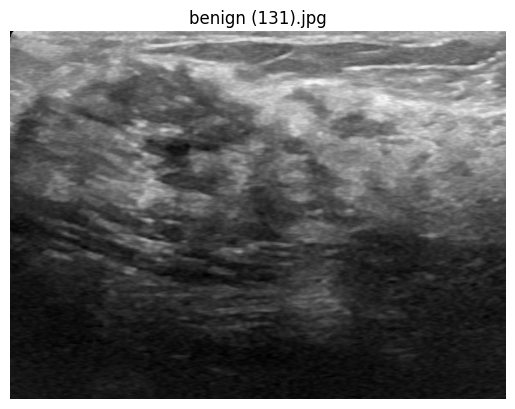

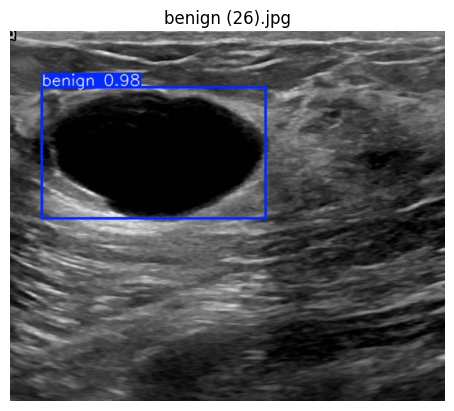

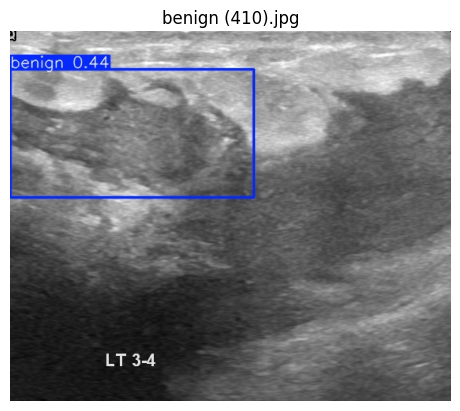

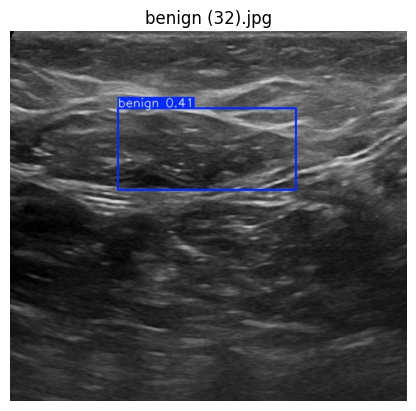

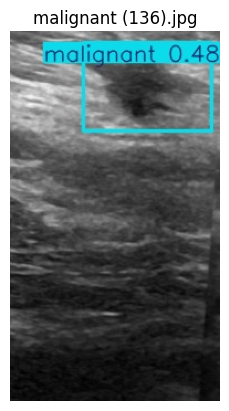

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt

folder = "runs/detect/predict"

for img_name in os.listdir(folder)[:60]:
    img = Image.open(os.path.join(folder, img_name))
    plt.imshow(img)
    plt.title(img_name)
    plt.axis("off")
    plt.show()

In [ ]:
import shutil

shutil.copy(
    "runs/detect/train/weights/best.pt",
    "/content/drive/MyDrive/best.pt"
)

print("✅ Model saved to Drive")

✅ Model saved to Drive


In [ ]:
from google.colab import files

files.download("/content/drive/MyDrive/best.pt")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>